In [1]:
import scanpy as sc
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import progeny
import pandas as pd
import scipy.stats
import scanpy_helpers as sh

sc.set_figure_params(figsize=(4, 4))

In [2]:
adata = sc.read_h5ad("../../data/30_merge_adata/adata_scvi_annotated.h5ad")
artifact_dir = "../../data/40_cluster_analysis"

In [3]:
!mkdir -p {artifact_dir}

In [4]:
sh.colors.set_scale_anndata(adata, "patient")
sh.colors.set_scale_anndata(adata, "timepoint")
sh.colors.set_scale_anndata(adata, "cell_type")
sh.colors.set_scale_anndata(adata, "response")

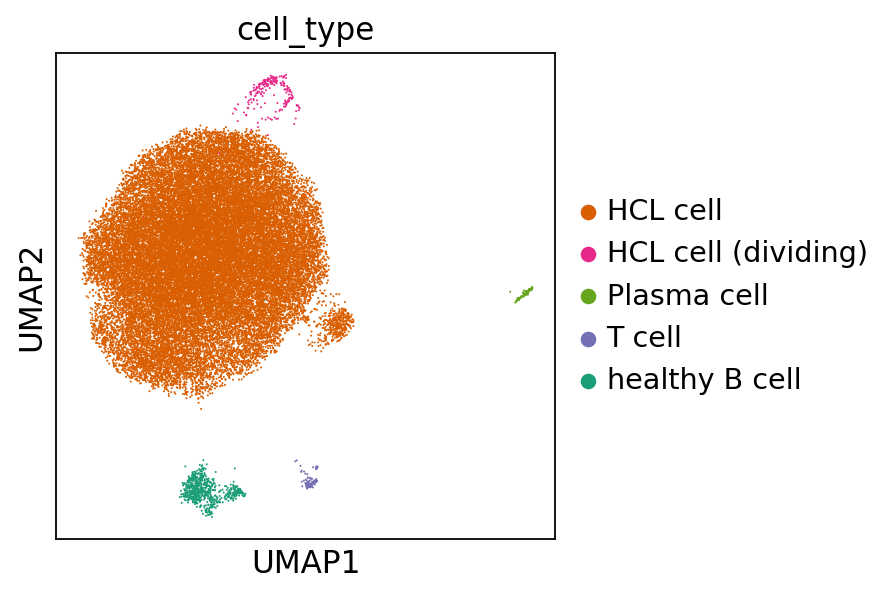

In [5]:
sc.pl.umap(adata, color="cell_type")

In [6]:
adata = adata[adata.obs["cell_type"] == "HCL cell", :]

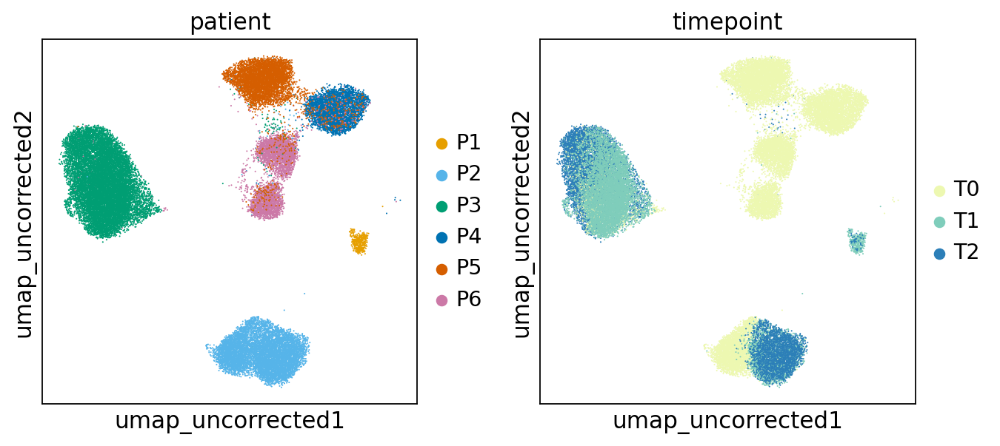

In [7]:
sc.pl.embedding(adata, "umap_uncorrected", color=["patient", "timepoint"])

P1
P2
P3
P4
P5
P6


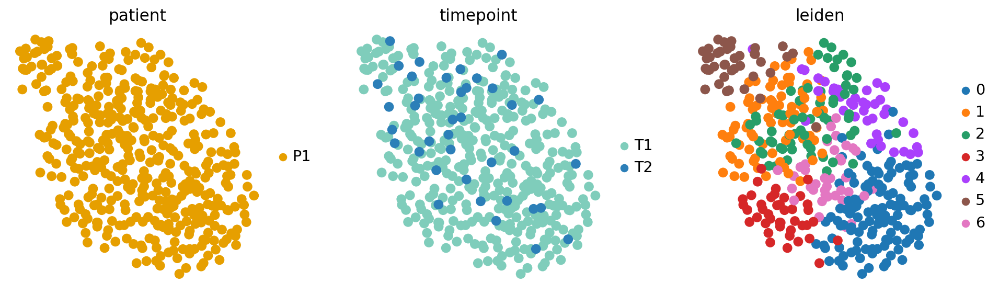

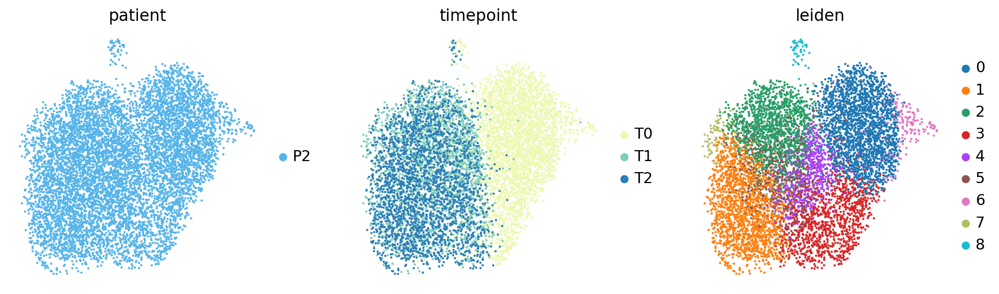

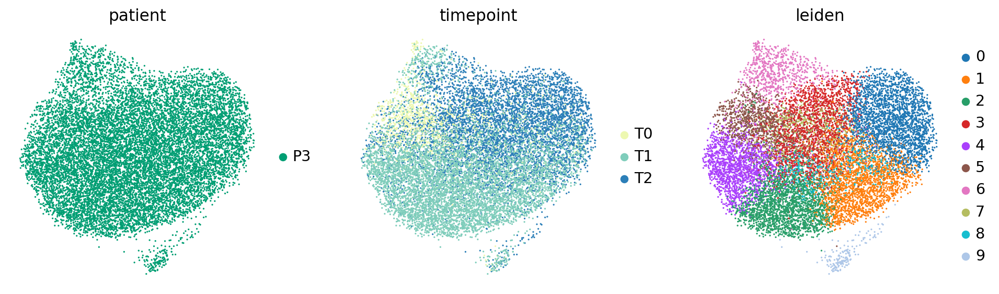

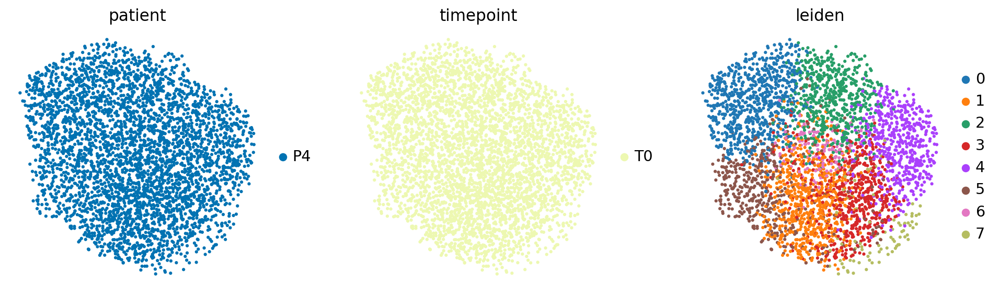

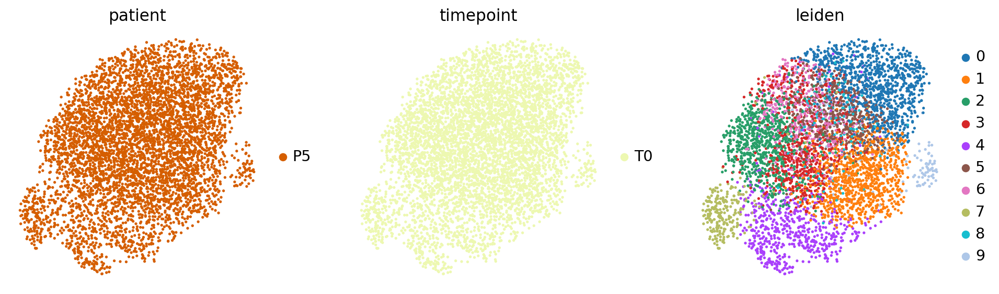

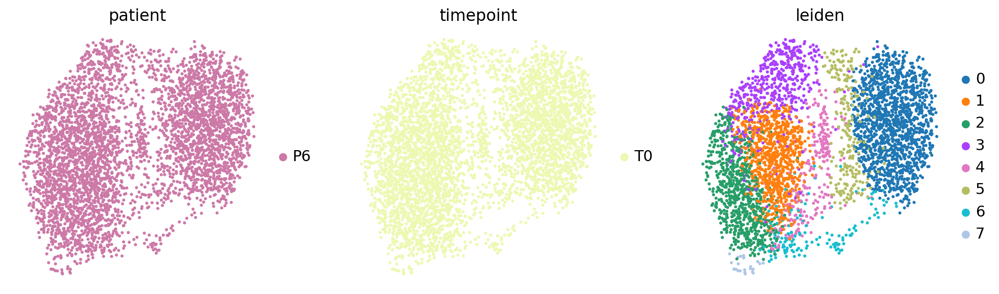

In [8]:
patient_adatas = dict()
for patient in adata.obs["patient"].sort_values().unique():
    print(patient)
    tmp_adata = adata[adata.obs["patient"] == patient, :].copy()
    sc.tl.pca(tmp_adata)
    sc.pp.neighbors(tmp_adata)
    sc.tl.umap(tmp_adata)
    sc.tl.leiden(tmp_adata, resolution=1)
    fig = sc.pl.umap(tmp_adata, color=["patient", "timepoint", "leiden"], ncols=4, return_fig=True, frameon=False)
    fig.savefig(f"{artifact_dir}/umap_{patient}.pdf", bbox_inches="tight", dpi=1200)
    patient_adatas[patient] = tmp_adata

In [9]:
for patient, tmp_adata in patient_adatas.items():
    tmp_adata.write_h5ad(f"{artifact_dir}/adata_{patient}.h5ad")

In [10]:
for tmp_adata in patient_adatas.values():
    sc.tl.rank_genes_groups(tmp_adata, method="wilcoxon", groupby="leiden")

It appears that in all patients, there is a cluster that is FOSB+/JUN+/DUSP1+.

P1
P2
P3
P4
P5
P6


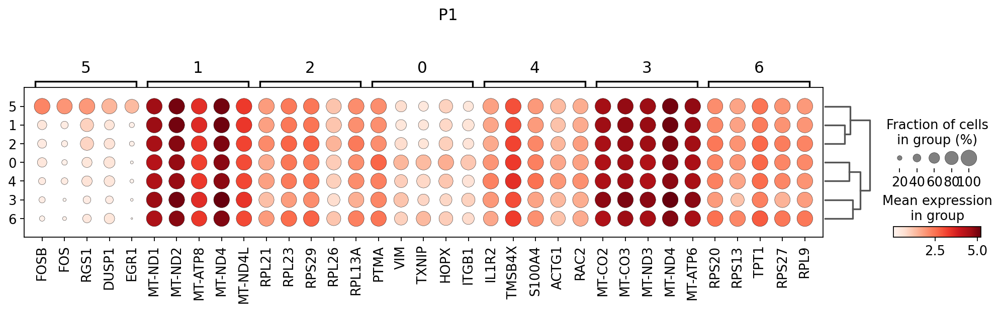

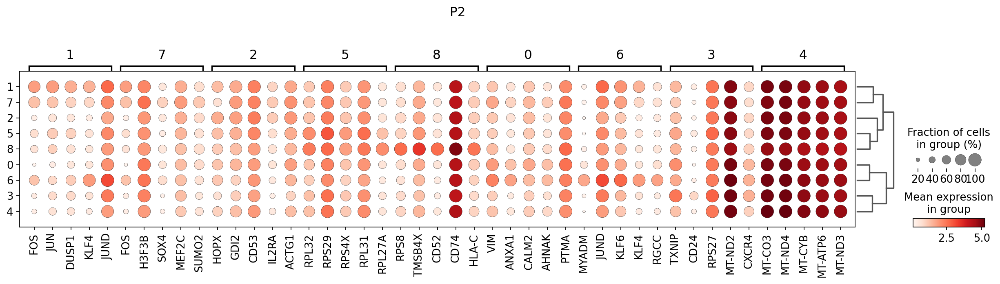

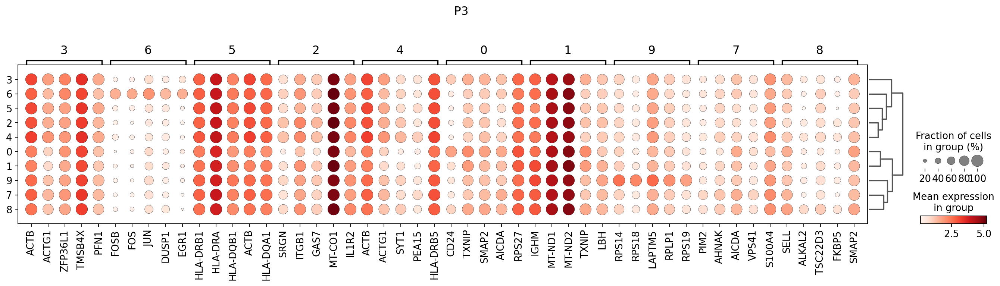

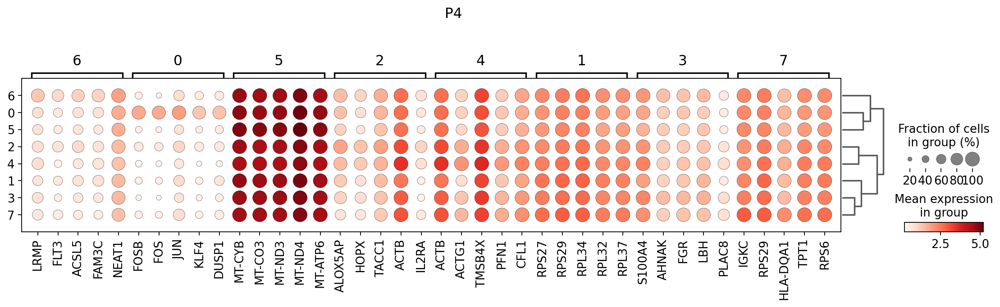

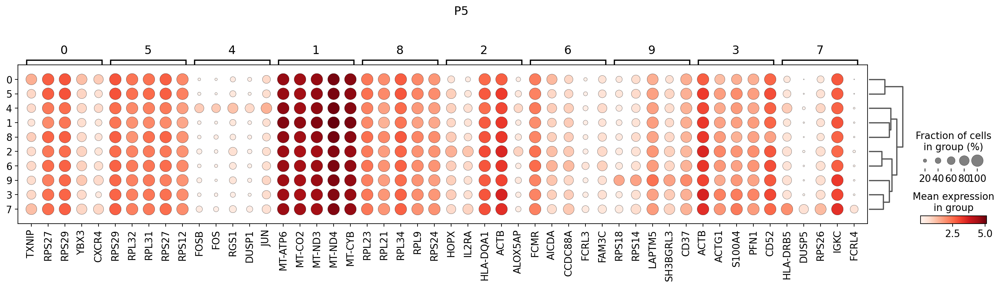

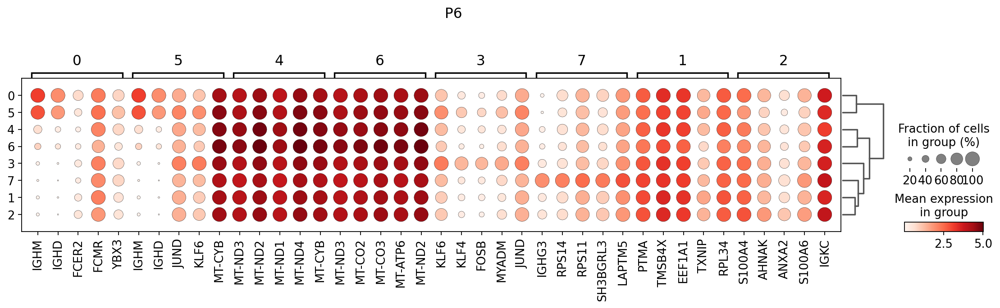

In [11]:
for tmp_patient, tmp_adata in patient_adatas.items():
    print(tmp_patient)
    fig = sc.pl.rank_genes_groups_dotplot(tmp_adata, n_genes=5, title=tmp_patient, return_fig=True)
    fig.savefig(f"{artifact_dir}/dotplot_{tmp_patient}.pdf", bbox_inches="tight")

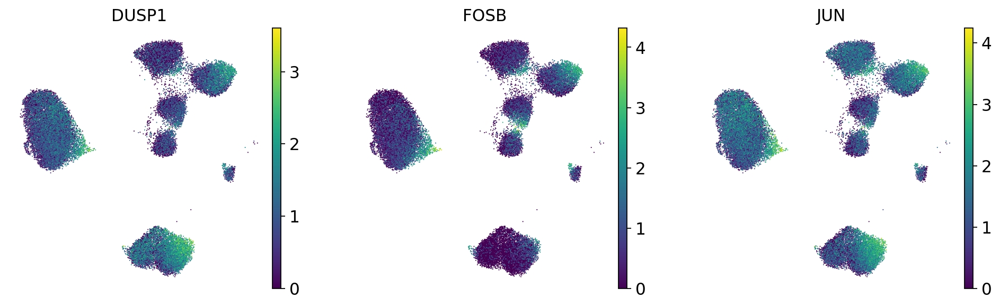

In [12]:
fig = sc.pl.embedding(adata, "umap_uncorrected", color=["DUSP1", "FOSB", "JUN"], frameon=False, return_fig=True)
fig.savefig(f"{artifact_dir}/umap_fos_dusp_jun_expression.pdf", bbox_inches="tight", dpi=1200)

P1


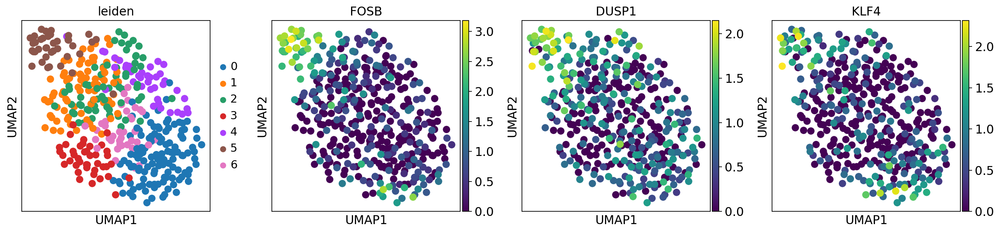

P2


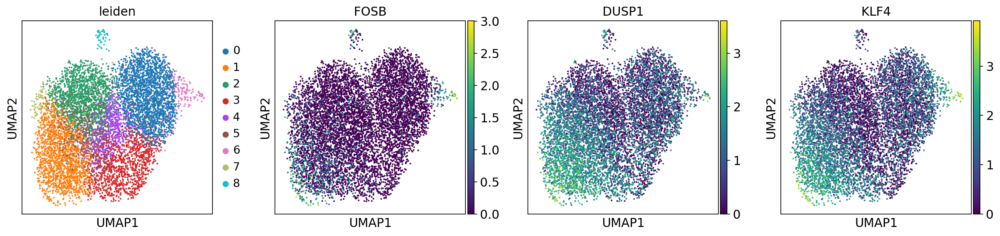

P3


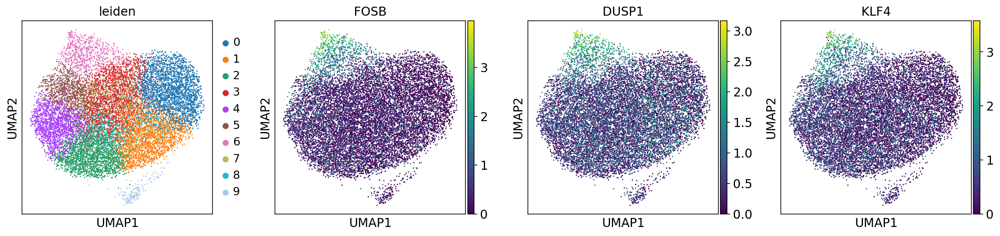

P4


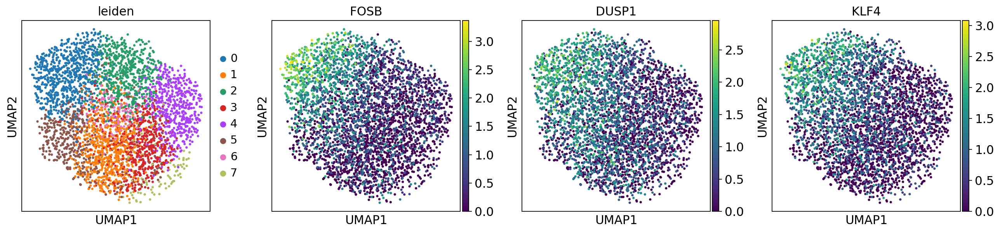

P5


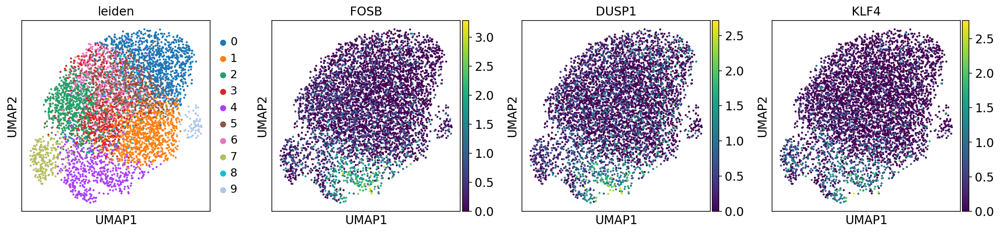

P6


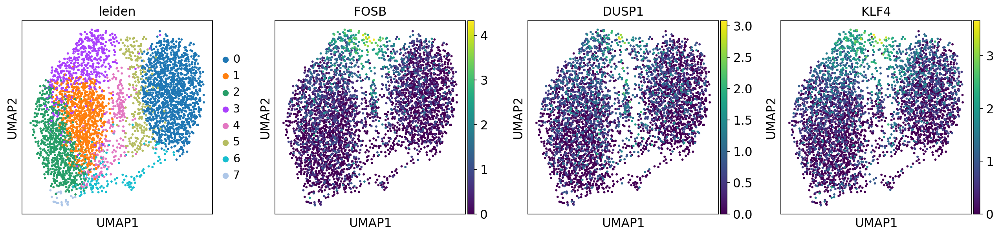

In [13]:
for tmp_patient, tmp_adata in patient_adatas.items():
    print(tmp_patient)
    sc.pl.umap(tmp_adata, color=["leiden", "FOSB", "DUSP1", "KLF4"])

In [14]:
# for each patient, the clusters that are FOS+ JUN+
fos_annotation = {"P1": [5], "P2": [6, 1], "P3": [6], "P4": [0], "P5": [4], "P6": [3]}

In [15]:
adata.obs["cell_phenotype"] = "DUSP1ˡᵒ╱FOSBˡᵒ╱JUNDˡᵒ"
for tmp_patient, tmp_adata in patient_adatas.items():
    adata.obs.loc[
        tmp_adata[
            tmp_adata.obs["leiden"].isin([str(x) for x in fos_annotation[tmp_patient]])
        ].obs_names,
        "cell_phenotype",
    ] = "DUSP1ʰᶦ╱FOSBʰᶦ╱JUNDʰᶦ"

Trying to set attribute `.obs` of view, copying.


/data/scratch/sturm/conda/envs/2021-hairy-cell-leukemia-wolf-scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'cell_phenotype' as categorical


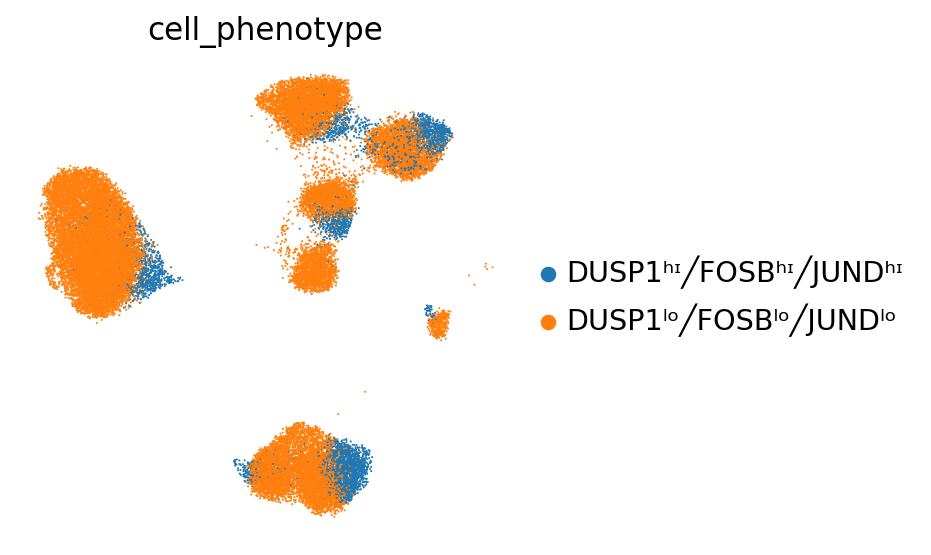

In [16]:
fig = sc.pl.embedding(adata, "umap_uncorrected", color=["cell_phenotype"], return_fig=True, frameon=False)
fig.savefig(f"{artifact_dir}/umap_cell_phenotype_uncorrected.pdf", bbox_inches="tight", dpi=1200)

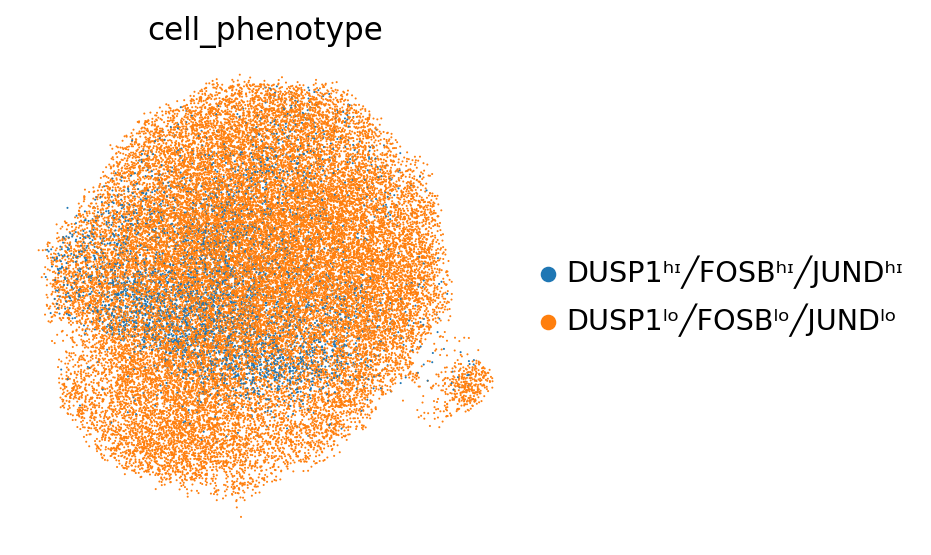

In [17]:
fig = sc.pl.embedding(adata, "umap", color=["cell_phenotype"], return_fig=True, frameon=False)
fig.savefig(f"{artifact_dir}/umap_cell_phenotype.pdf", bbox_inches="tight", dpi=1200)

In [18]:
adata.write_h5ad(f"{artifact_dir}/adata_malignant_b_cells.h5ad")